In [41]:
import os, sys
import gymnasium as gym
import text_flappy_bird_gym
import time
import numpy as np
from collections import defaultdict
import matplotlib.pyplot as plt
from tqdm import tqdm
import random

# MonteCarlo Agent

In [104]:
class MonteCarloAgent():
    def __init__(self):
        self.num_actions = 2  # Assuming 2 actions: flap or not
        self.epsilon = 0.8  # Start with 80% exploration
        self.epsilon_min = 0.01  # Minimum exploration rate
        self.epsilon_decay = 0.995  # Epsilon decay rate after each episode
        self.episode = []
        self.Q = defaultdict(lambda: 0)
        self.N = defaultdict(lambda: 0)
        self.state = None
        self.gamma = 0.5    # start with 0.5 step-size
        self.alpha = 0.1
        self.alpha_decay = 0.995
        self.alpha_min = 0.01
        
    def agent_init(self, agent_init_info):
  
        # Store the parameters provided in agent_init_info
        self.num_actions = agent_init_info["num_actions"]
        self.epsilon = agent_init_info["epsilon"]
        self.epsilon_decay = agent_init_info["eps_decay"]
        self.alpha = agent_init_info["alpha"]
        self.alpha_decay = agent_init_info["step_size_decay"]
        self.gamma = agent_init_info["discount"]
        
    

    def get_probs(self, Q, epsilon):
        policy_s = np.ones(self.num_actions) * epsilon / self.num_actions
        best_a = self.argmax_random([Q[(self.state,0)],Q[(self.state,1)]])
        policy_s[best_a] = 1 - epsilon + (epsilon / self.num_actions)
        return policy_s
    
    def argmax_random(self,array):
        max_val = np.max(array)
        max_indices = np.where(array == max_val)[0]
        return np.random.choice(max_indices)
    
    def agent_step(self, state, env):
        action = np.random.choice(np.arange(self.num_actions), p=self.get_probs(self.Q, self.epsilon))
        #print(self.get_probs(self.Q,self.epsilon))
        next_state, reward, done,_, info = env.step(action)
        self.episode.append((state, action, reward))
        self.state = next_state
        return next_state, reward, done, info

    def update_Q(self):
        G = 0
        visited = set()
        for t in reversed(range(len(self.episode))):
            state, action, reward = self.episode[t]
            G = self.gamma * G + reward
            if (state, action) not in visited:
                self.N[(state, action)] += 1
                self.Q[(state, action)] += (G - self.Q[state, action]) / self.N[state, action]
                visited.add((state, action))

    def update_params(self):
        self.epsilon = max(self.epsilon * self.epsilon_decay, self.epsilon_min)
        self.alpha = max(self.alpha * self.alpha_decay, self.alpha_min)

In [105]:
env = gym.make('TextFlappyBird-v0', height = 15, width = 20, pipe_gap = 4)
num_episodes = 5000
total_reward = []
total_score = []
agent_mc = MonteCarloAgent()
for i_episode in tqdm(range(num_episodes)):
    obs, _ = env.reset()
    score = 0
    
    while True:
        obs, reward, done, info = agent_mc.agent_step(obs, env)
        
        score += reward
        if info['score'] >50 or done: # in case the bird stays alive for too long time
            agent_mc.update_Q()
            total_score.append(info['score'])
            total_reward.append(score)
            agent_mc.update_params()  # Update epsilon and alpha after each episode
            break
env.close()

100%|██████████| 5000/5000 [02:41<00:00, 30.94it/s] 


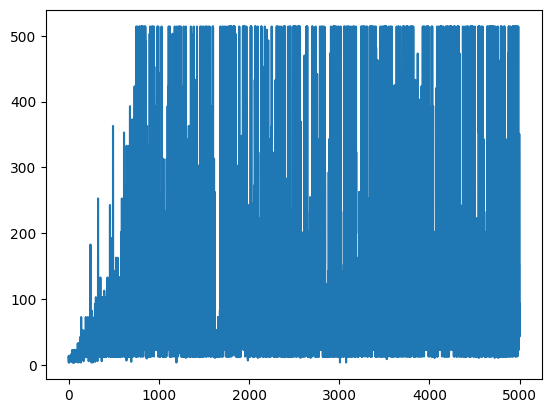

In [88]:
plt.plot(total_reward)

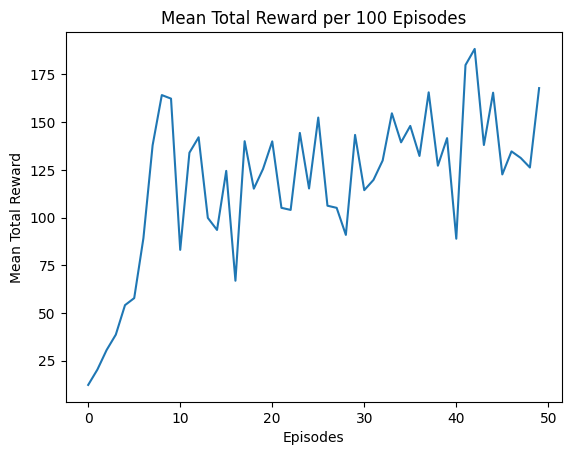

In [89]:
mean_rewards = [np.mean(total_reward[i:i+100]) for i in range(0, len(total_reward), 100)]
# Plot the mean rewards
plt.plot(mean_rewards)
plt.xlabel('Episodes')
plt.ylabel('Mean Total Reward')
plt.title('Mean Total Reward per 100 Episodes')
plt.show()

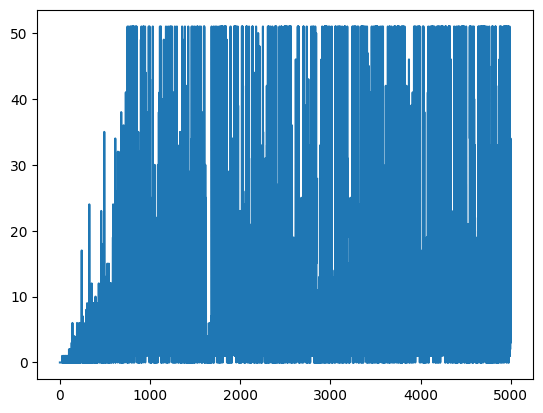

In [90]:
plt.plot(total_score)

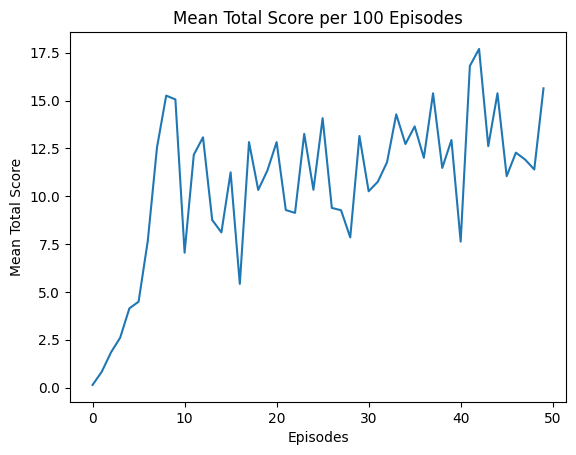

In [91]:
mean_score = [np.mean(total_score[i:i+100]) for i in range(0, len(total_score), 100)]
# Plot the mean rewards
plt.plot(mean_score)
plt.xlabel('Episodes')
plt.ylabel('Mean Total Score')
plt.title('Mean Total Score per 100 Episodes')
plt.show()

# Hyperparameter tune

  0%|          | 0/3 [00:00<?, ?it/s]

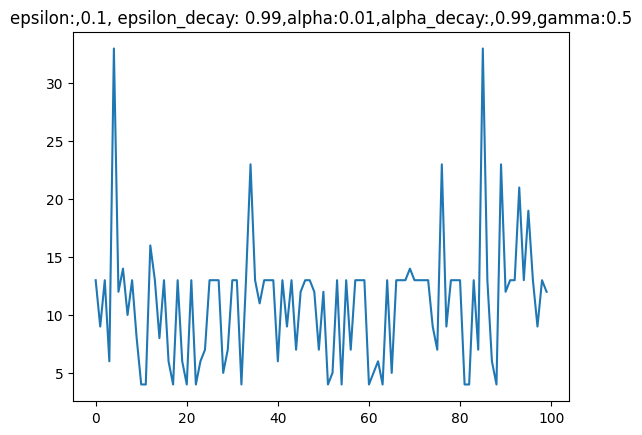

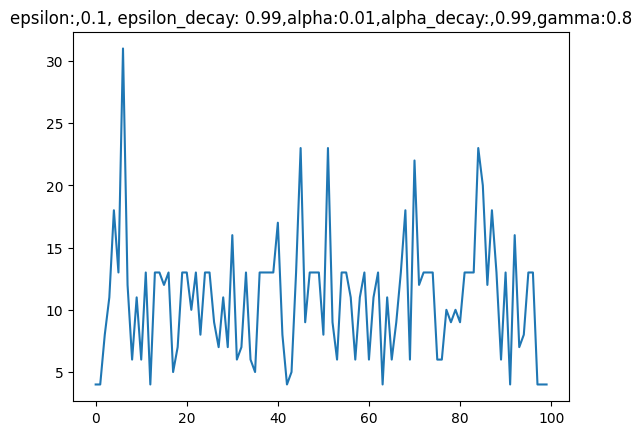

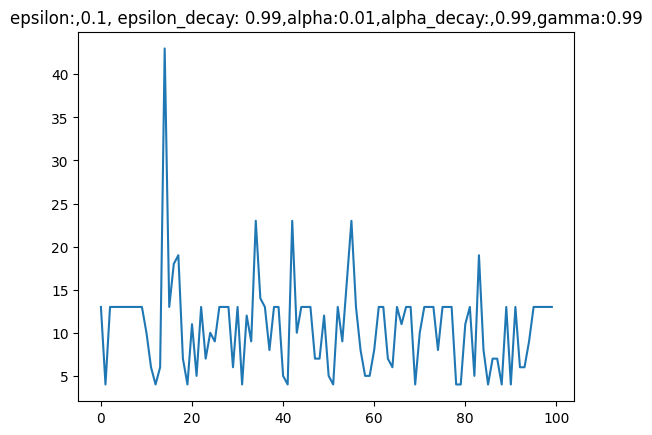

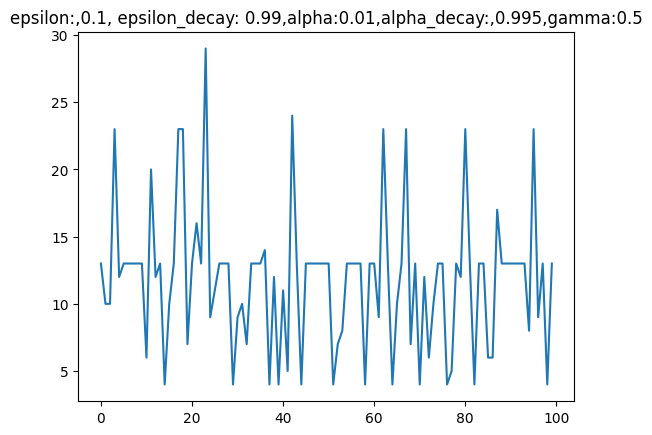

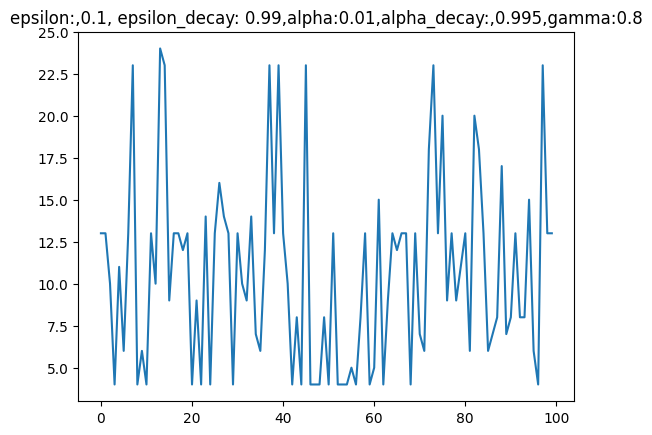

...

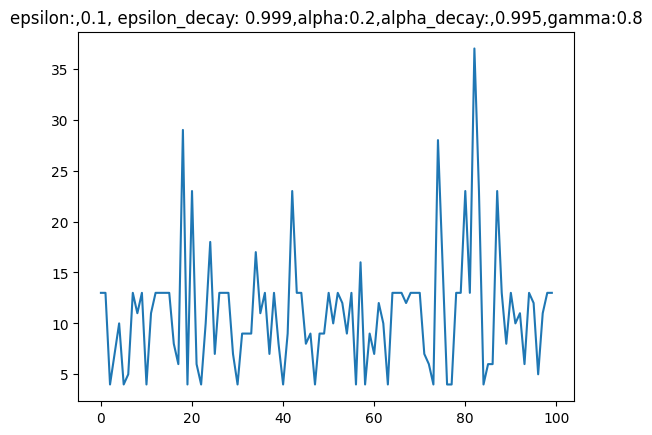

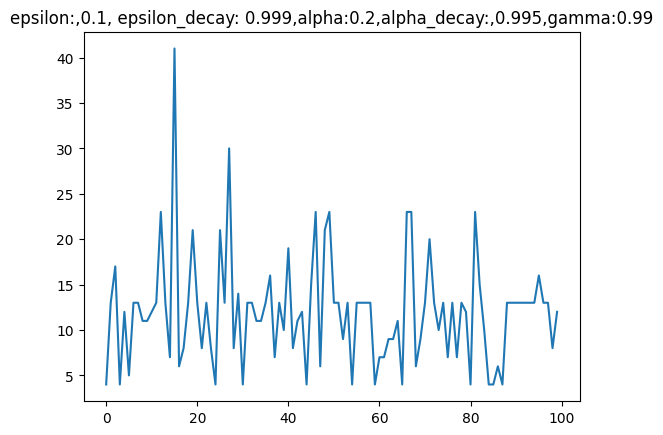

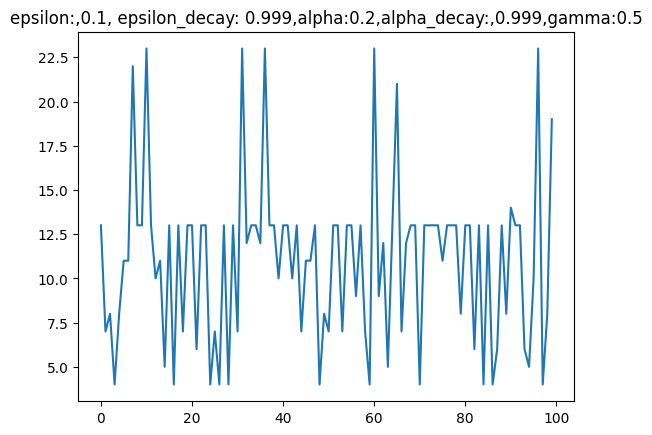

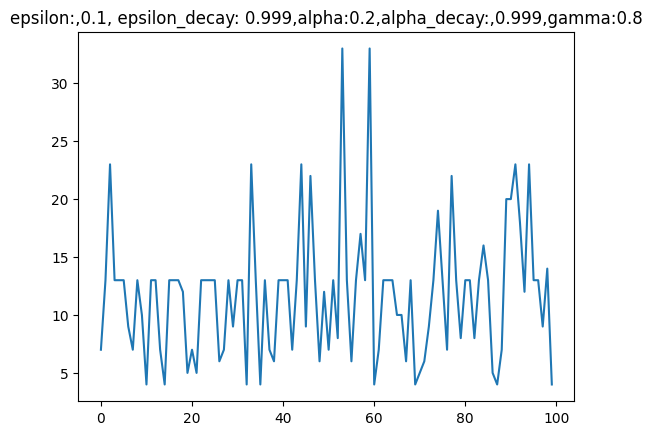

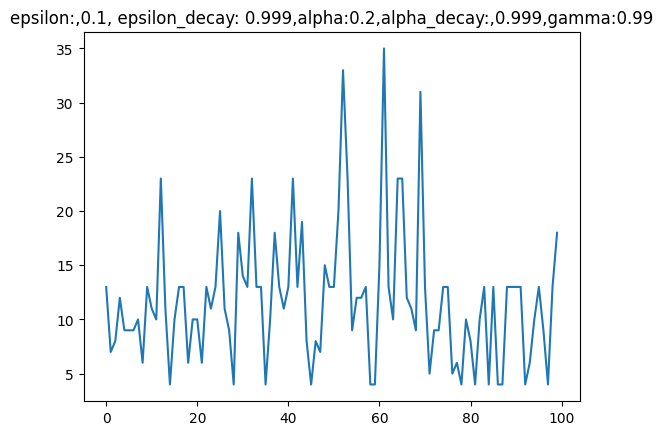

 33%|███▎      | 1/3 [00:06<00:12,  6.25s/it]

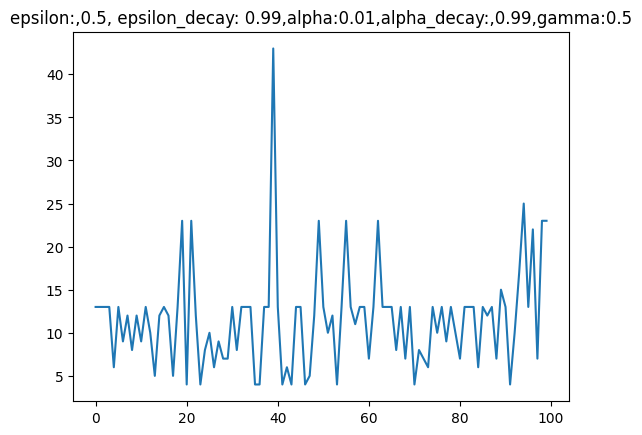

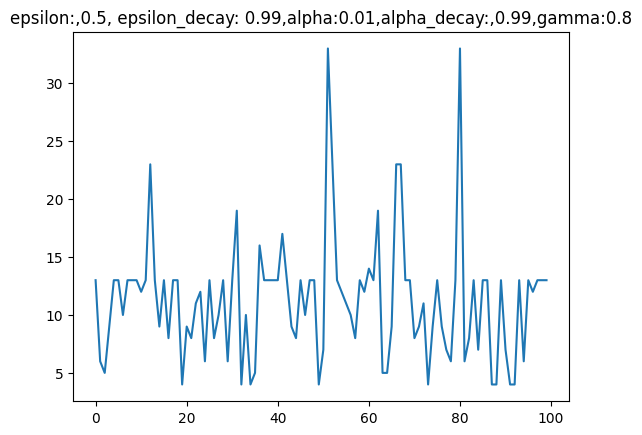

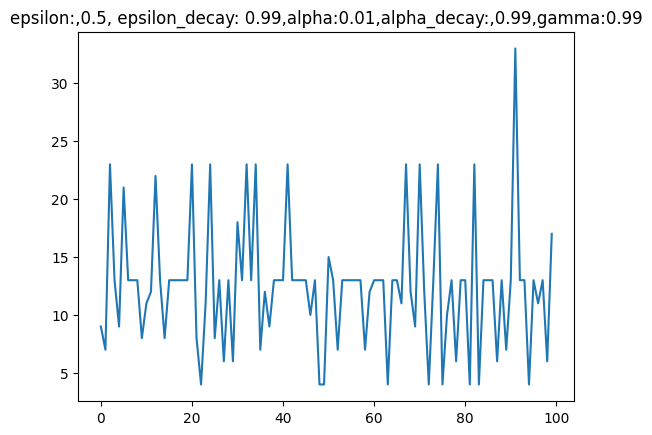

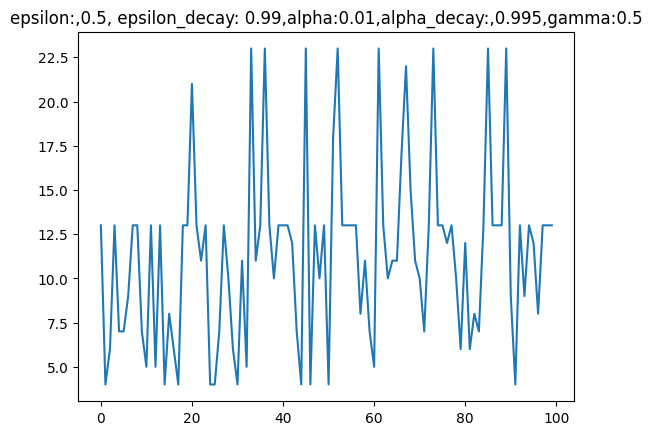

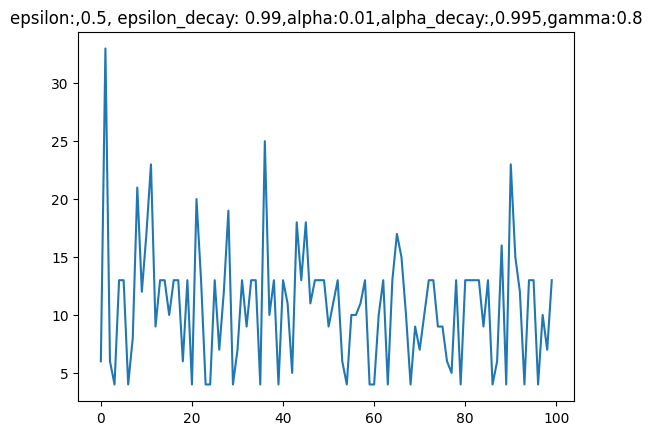

...

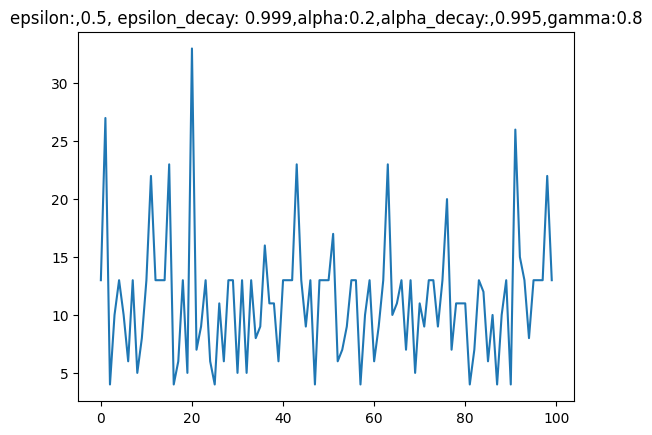

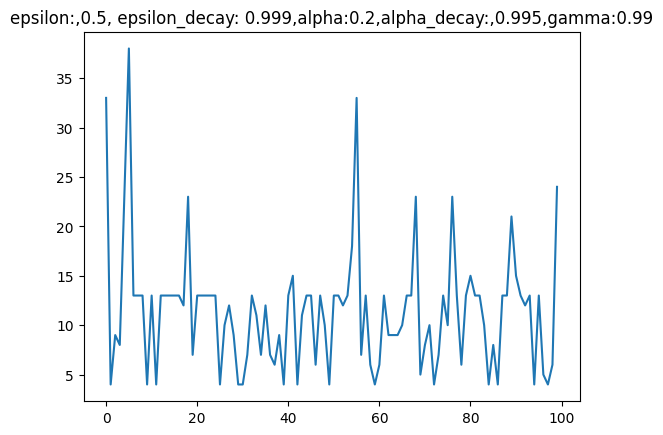

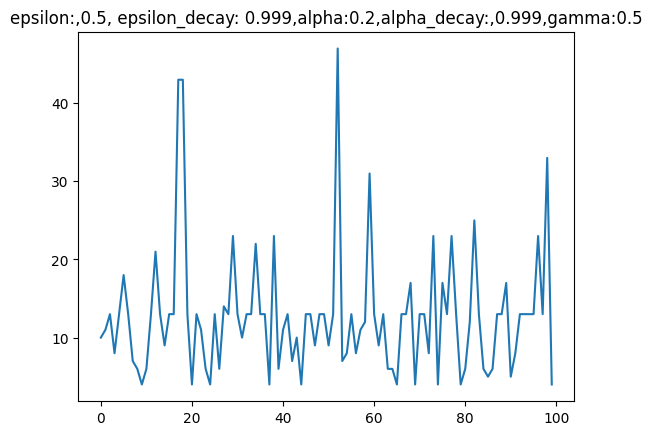

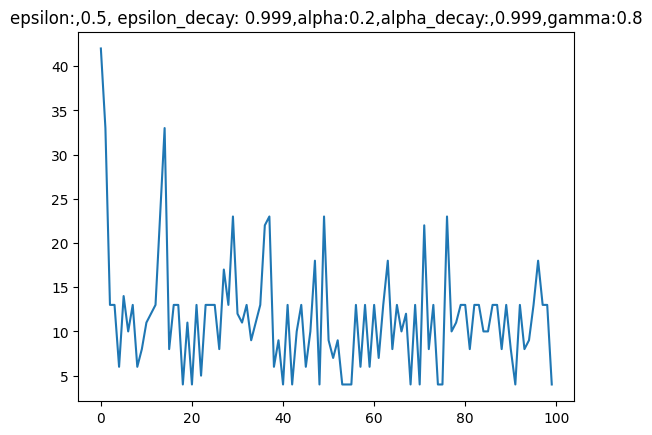

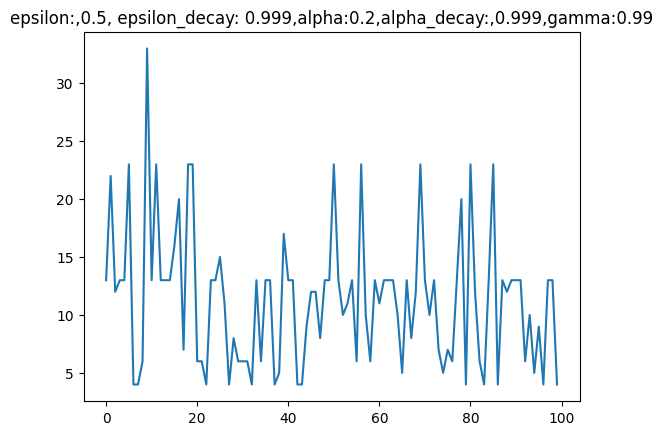

 67%|██████▋   | 2/3 [00:12<00:06,  6.29s/it]

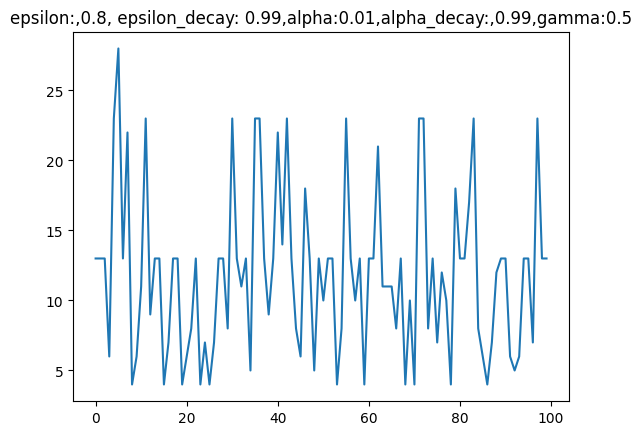

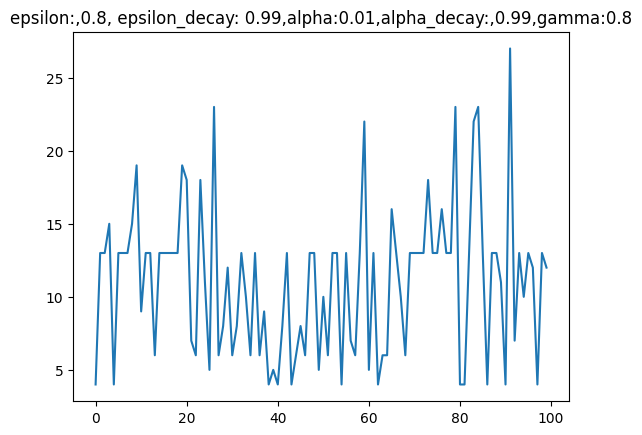

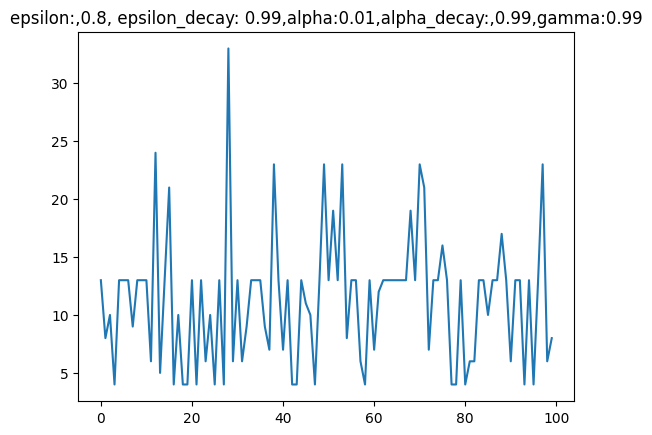

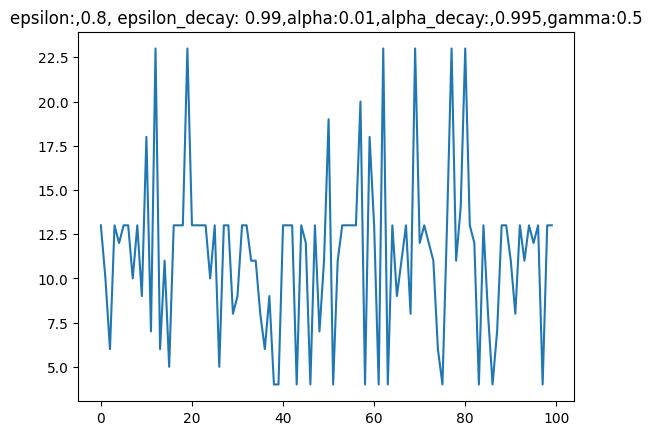

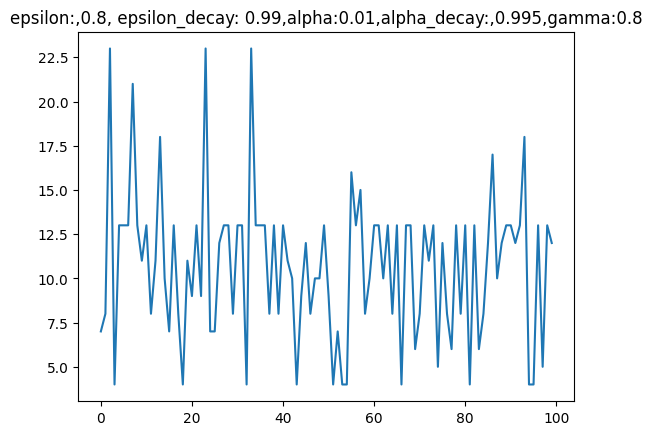

...

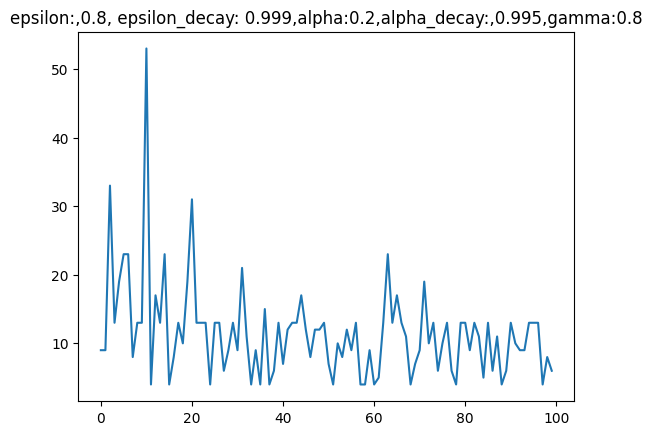

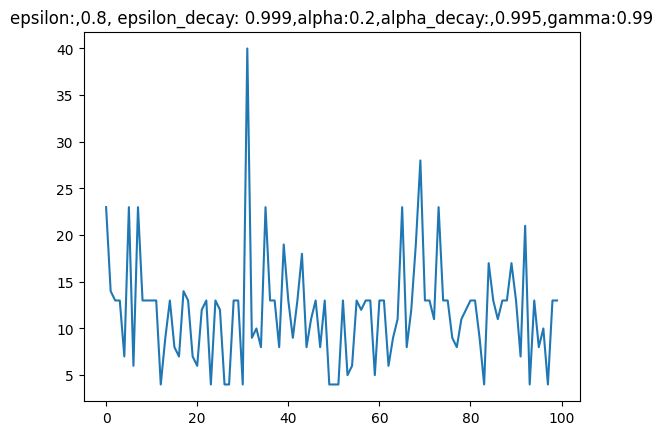

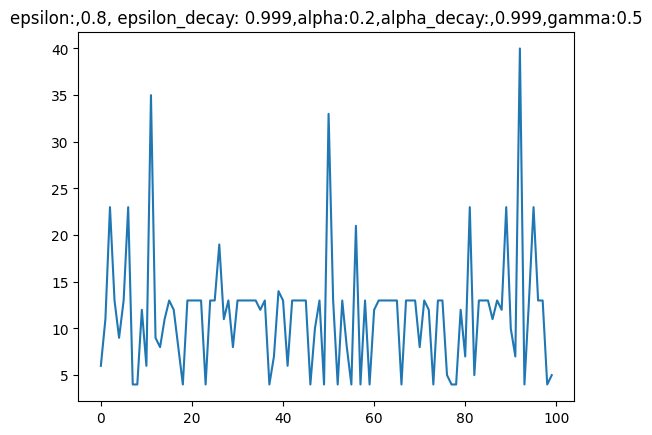

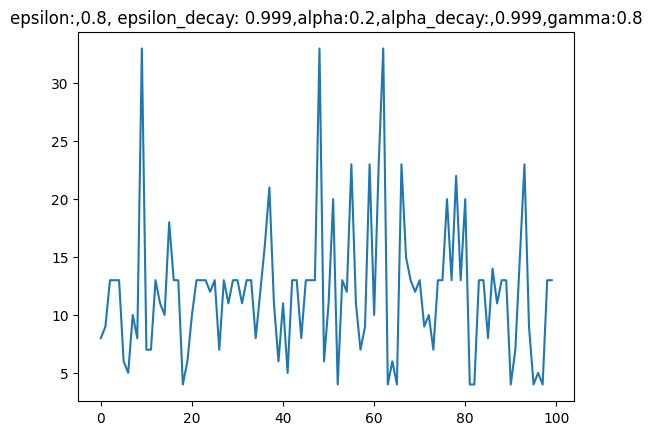

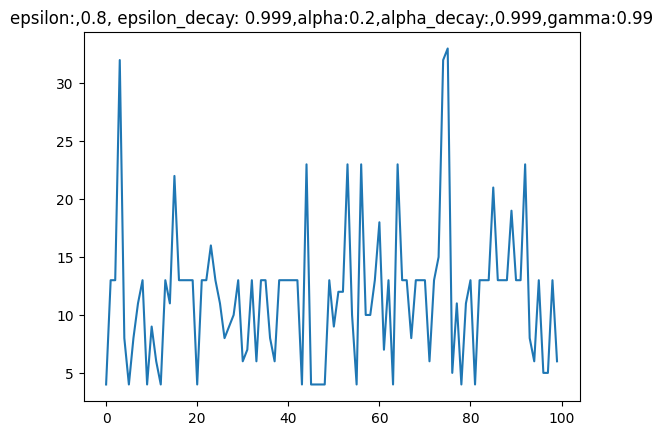

100%|██████████| 3/3 [00:18<00:00,  6.26s/it]

Best Parameters: {'epsilon': 0.1, 'alpha': 0.1, 'epsilon_decay': 0.995, 'alpha_decay': 0.995, 'gamma': 0.99}
Best Reward: 13.05


In [117]:
def run_episode_with_agent(env, agent):
    obs, _ = env.reset()
    total_reward = 0
    while True:
        obs, reward, done, info = agent.agent_step(obs, env)
        total_reward += reward
        if done:
            break
    return total_reward

def grid_search(env, param_grid, num_episodes_per_param=100):
    best_params = None
    best_reward = -float('inf')
    
    for epsilon in tqdm(param_grid['epsilon']):
        for alpha in param_grid['alpha']:
            for epsilon_decay in param_grid['epsilon_decay']:
                for alpha_decay in param_grid['alpha_decay']:
                    for gamma in param_grid['gamma']:
                        # Initialize the agent with the current set of parameters
                        agent = MonteCarloAgent()
                        agent.epsilon = epsilon
                        agent.alpha = alpha
                        agent.epsilon_decay = epsilon_decay
                        agent.alpha_decay = alpha_decay
                        agent.gamma = gamma
                        
                        

                        # Evaluate the agent over multiple episodes
                        rewards = []
                        for _ in range(num_episodes_per_param):
                            reward = run_episode_with_agent(env, agent)
                            rewards.append(reward)
                        plt.plot(rewards)
                        plt.title(f'epsilon:,{epsilon}, epsilon_decay: {epsilon_decay},alpha:{alpha},alpha_decay:,{alpha_decay},gamma:{gamma}')
                        plt.show()

                        mean_reward = np.mean(rewards)
                        if mean_reward > best_reward:
                            best_reward = mean_reward
                            best_params = {'epsilon': epsilon, 'alpha': alpha, 
                                           'epsilon_decay': epsilon_decay, 
                                           'alpha_decay': alpha_decay, 'gamma': gamma}
    
    return best_params, best_reward

# Define the parameter grid
param_grid = {
    'epsilon': [0.1, 0.5, 0.8],
    'alpha': [0.01, 0.1, 0.2],
    'epsilon_decay': [0.99, 0.995, 0.999],
    'alpha_decay': [0.99, 0.995, 0.999],
    'gamma': [0.5, 0.8, 0.99]
}

env = gym.make('TextFlappyBird-v0', height = 15, width = 20, pipe_gap = 4)
best_params, best_reward = grid_search(env, param_grid)
print("Best Parameters:", best_params)
print("Best Reward:", best_reward)
env.close()

# Agent Sarsa:

In [45]:
class SarsaAgent():
    def __init__(self):
        self.num_states_x, self.num_states_y = 15, 20 # all the possible states
        self.num_actions = 2
        self.Q = np.zeros((self.num_states_x, self.num_states_y, self.num_actions))
        self.alpha = 0.1
        self.gamma = 1
        self.epsilon = 0.1
        self.state = None
        self.prev_state = None
        self.prev_action = None
        
    def agent_start(self, state):
        current_q = [self.Q[state + (action,)] for action in range(self.num_actions)]
        if  np.random.uniform(0, 1)< self.epsilon:
            action =random.randint(0,self.num_actions-1)
        else:
            action = self.argmax_random(current_q)
        self.prev_state = state
        self.prev_action = action
        return action
    
    def argmax_random(self, array):
        max_val = np.max(array)
        max_indices = np.where(array == max_val)[0]
        return np.random.choice(max_indices)
    
    def agent_step(self, reward, state):
        current_q = [self.Q[state + (action,)] for action in range(self.num_actions)]
        if  np.random.uniform(0, 1)< self.epsilon:
            action =random.randint(0,self.num_actions-1)
        else:
            action = self.argmax_random(current_q)
        self.Q[self.prev_state + (self.prev_action,)] = self.Q[self.prev_state + (self.prev_action,)] +\
         self.alpha*(reward + self.gamma*(current_q[action])-self.Q[self.prev_state + (self.prev_action,)])
        
        self.prev_state = state
        self.prev_action = action
        return action
    
    def agent_end(self, reward):

        self.Q[self.prev_state + (self.prev_action,)] = self.Q[self.prev_state + (self.prev_action,)] +\
         self.alpha*(reward -self.Q[self.prev_state + (self.prev_action,)])
         

In [65]:
env = gym.make('TextFlappyBird-v0', height = 15, width = 20, pipe_gap = 4)
num_episodes = 5000
total_reward = []
total_score = []
agent_sa = SarsaAgent()
for i_episode in range(num_episodes):
    obs, _ = env.reset()
    score = 0
    action = agent_sa.agent_start(obs)
    obs, reward, done,_, info = env.step(action)
    while True:
        action = agent_sa.agent_step(reward, obs)
        obs, reward, done,_, info = env.step(action)
        score += reward
        if info['score'] >20 or done:
            agent_sa.agent_end(reward)
            total_score.append(info['score'])
            total_reward.append(score)
            break
env.close()

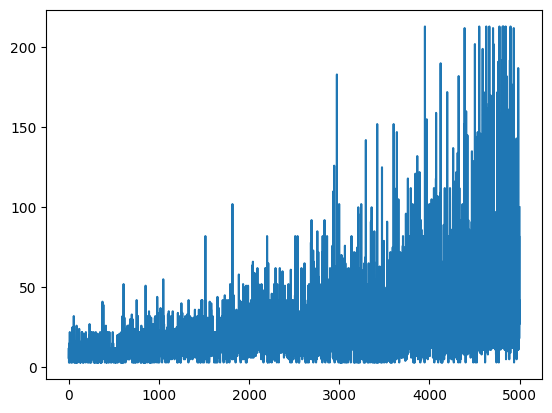

In [47]:
plt.plot(total_reward)

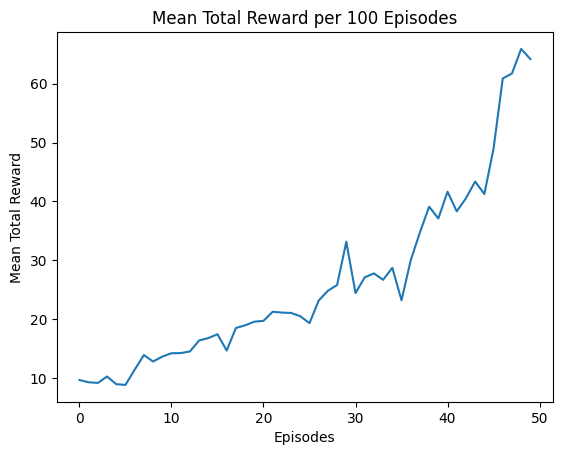

In [48]:
mean_rewards = [np.mean(total_reward[i:i+100]) for i in range(0, len(total_reward), 100)]
# Plot the mean rewards
plt.plot(mean_rewards)
plt.xlabel('Episodes')
plt.ylabel('Mean Total Reward')
plt.title('Mean Total Reward per 100 Episodes')
plt.show()

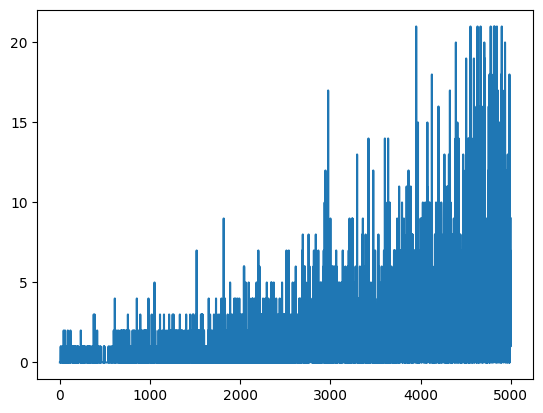

In [49]:
plt.plot(total_score)

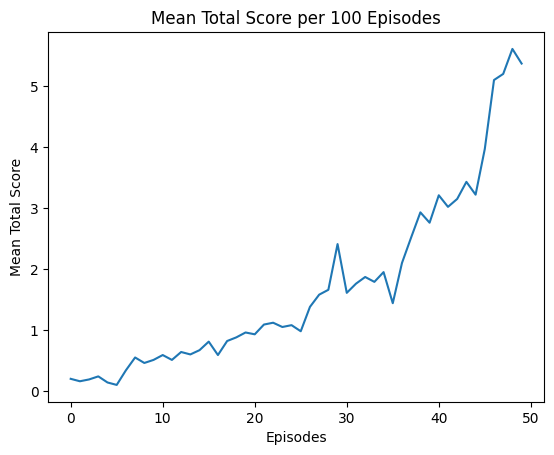

In [50]:
mean_score = [np.mean(total_score[i:i+100]) for i in range(0, len(total_score), 100)]
# Plot the mean rewards
plt.plot(mean_score)
plt.xlabel('Episodes')
plt.ylabel('Mean Total Score')
plt.title('Mean Total Score per 100 Episodes')
plt.show()

  0%|          | 0/3 [00:00<?, ?it/s]

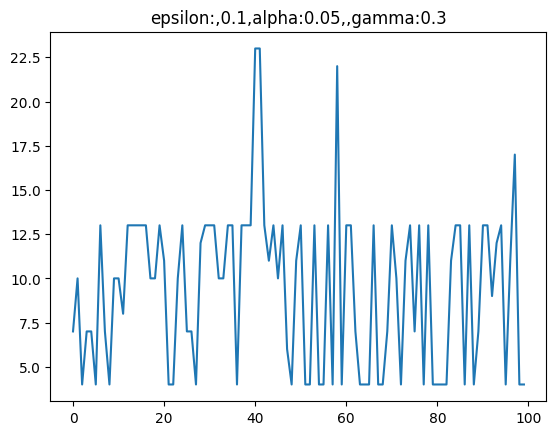

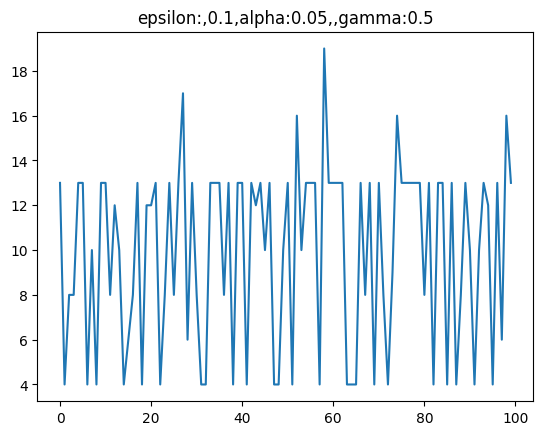

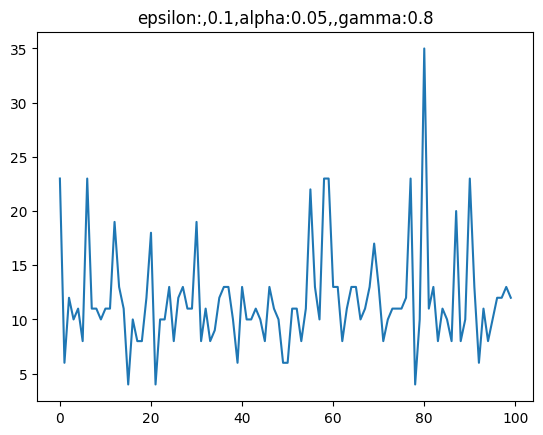

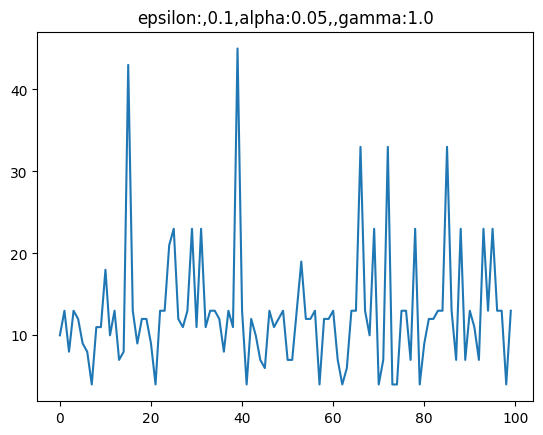

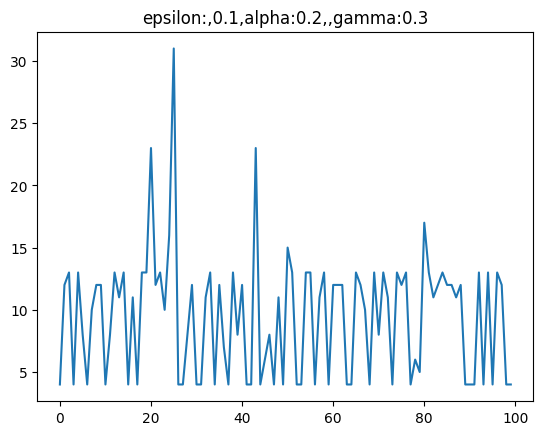

...

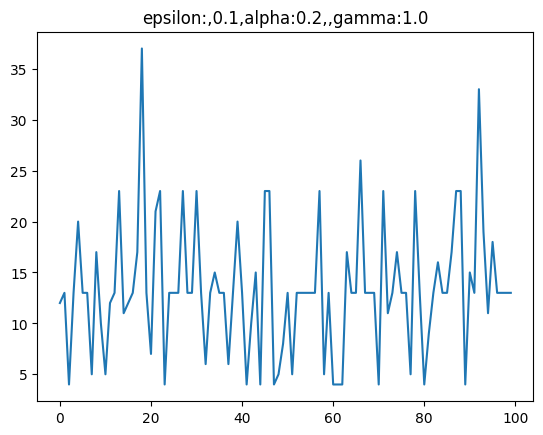

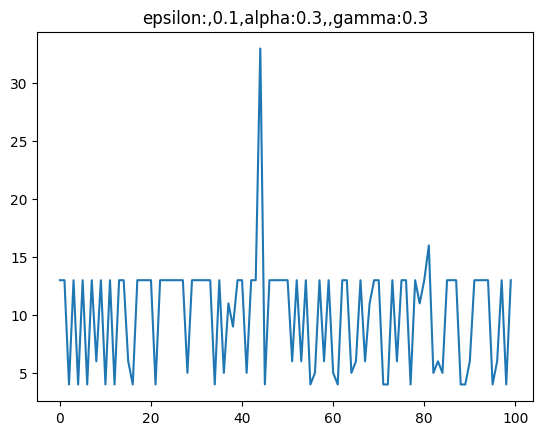

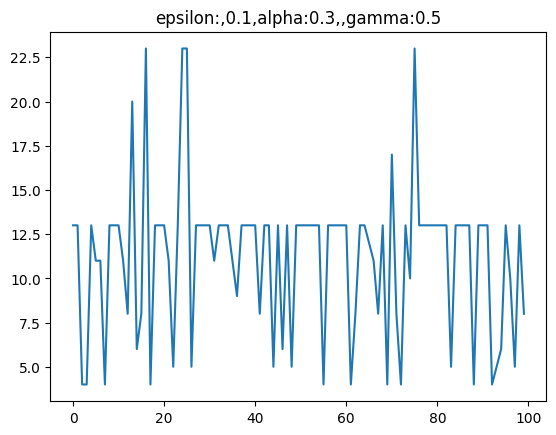

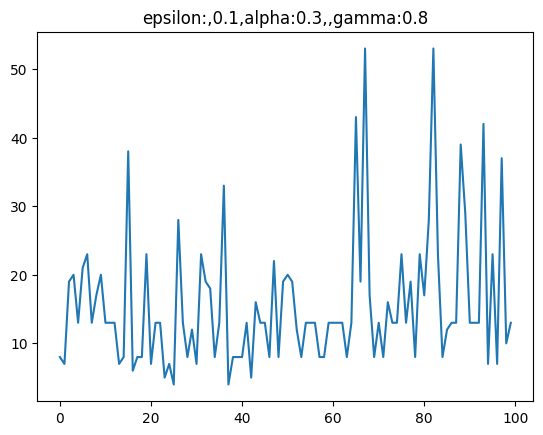

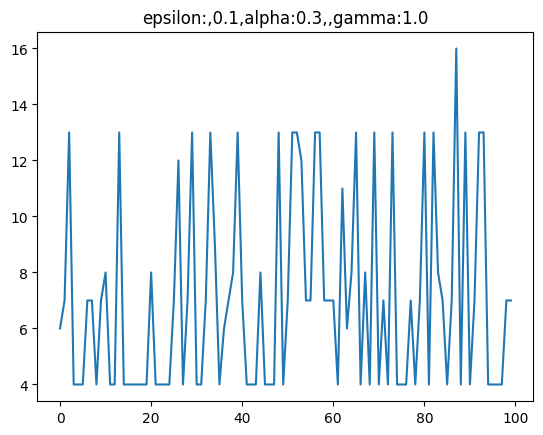

 33%|███▎      | 1/3 [00:00<00:01,  1.39it/s]

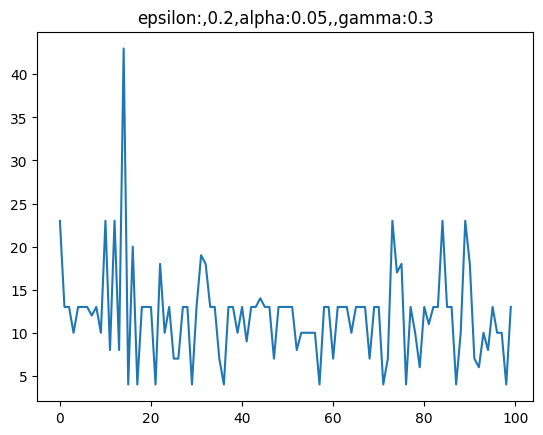

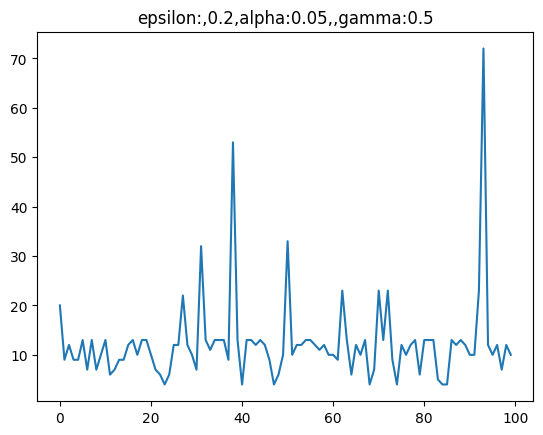

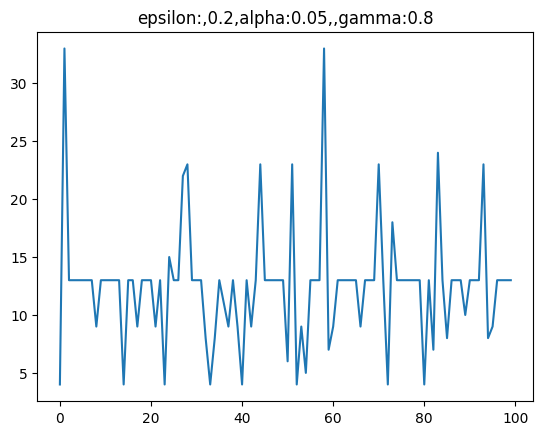

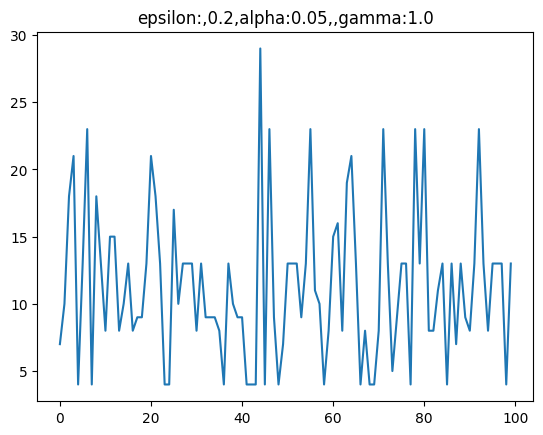

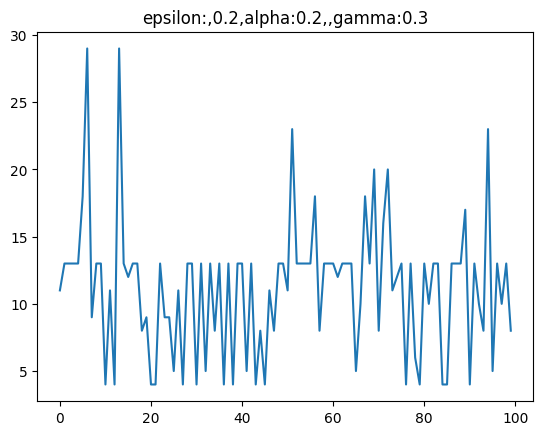

...

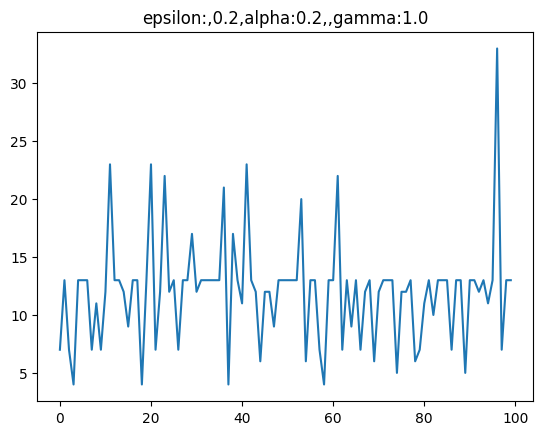

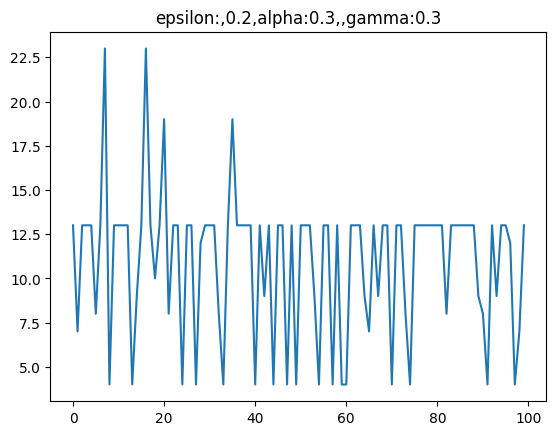

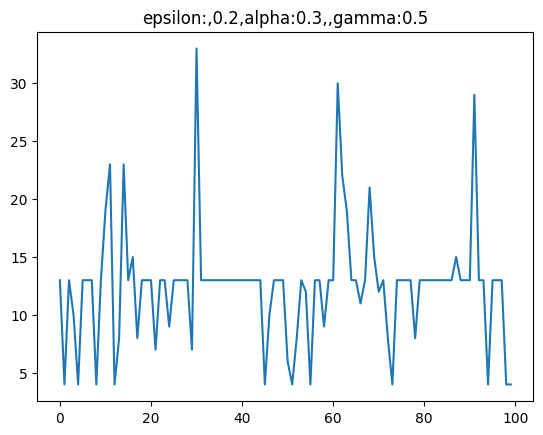

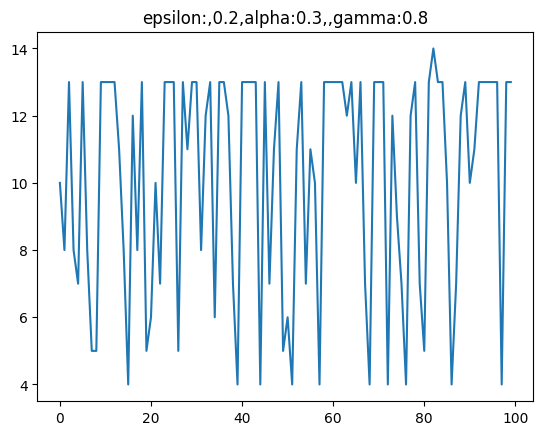

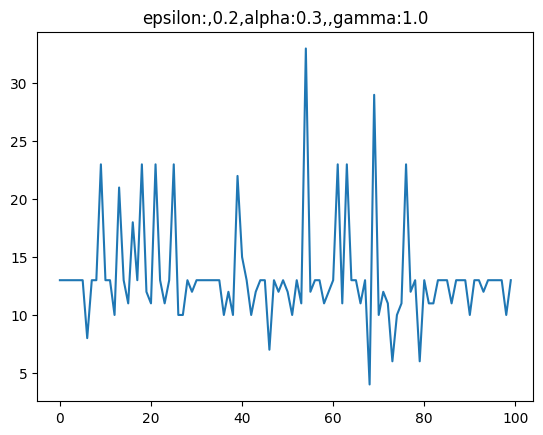

 67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

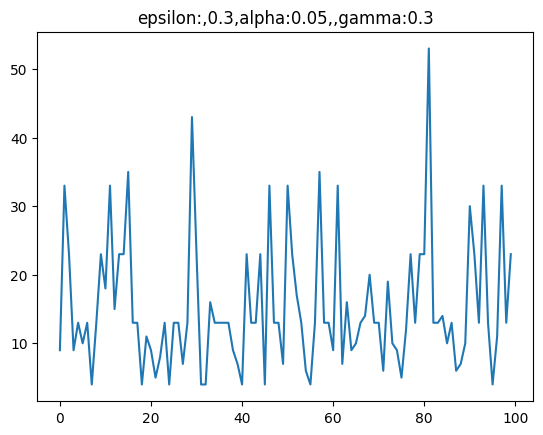

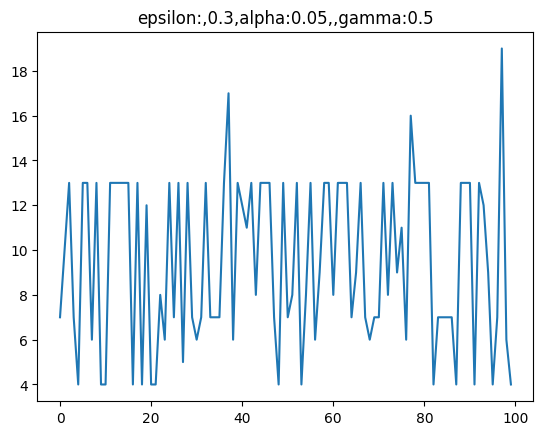

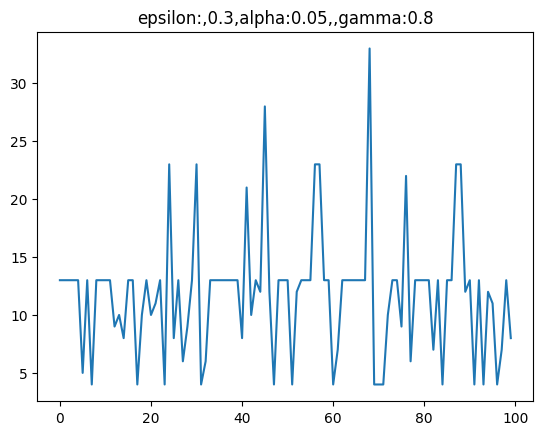

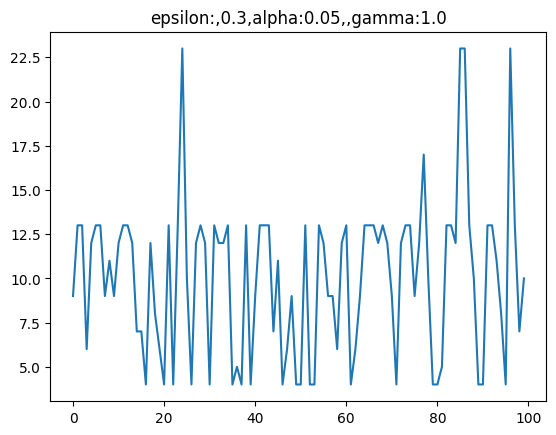

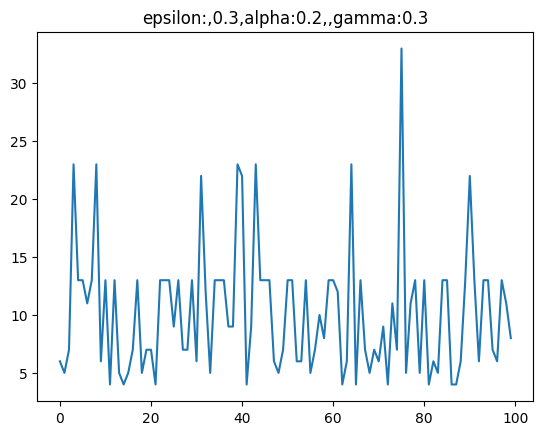

...

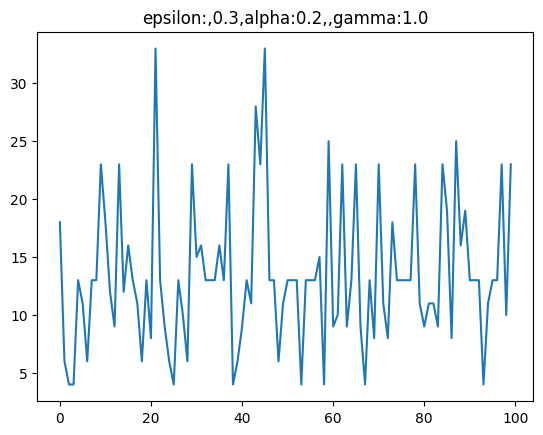

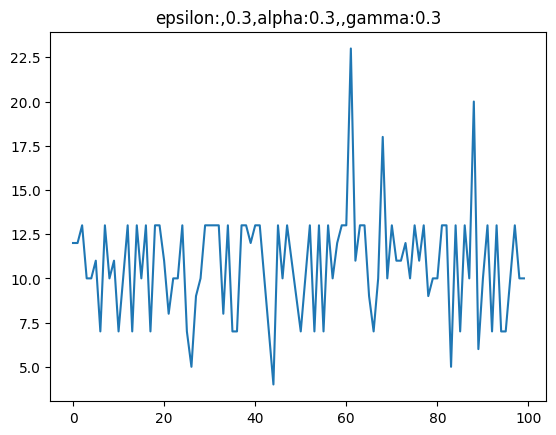

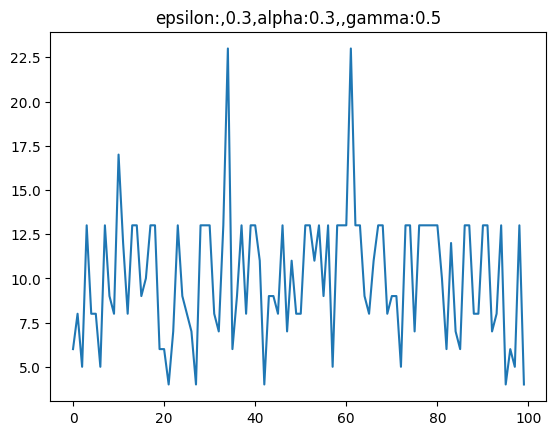

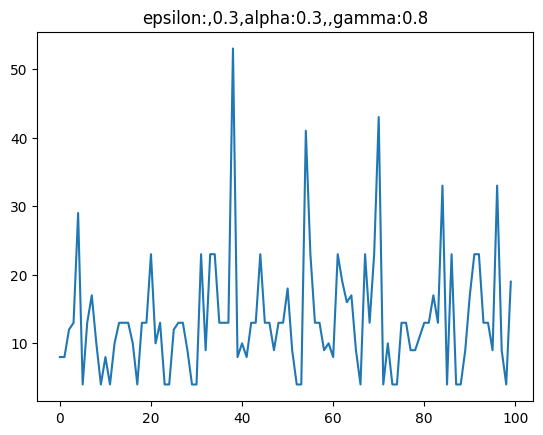

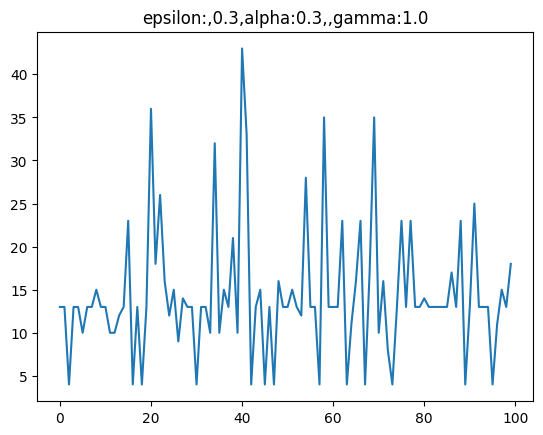

100%|██████████| 3/3 [00:02<00:00,  1.31it/s]

Best Parameters: {'epsilon': 0.1, 'alpha': 0.3, 'gamma': 0.8}
Best Reward: 15.63


In [119]:
def run_episode_with_agent(env, agent):
    total_reward = 0
    state, _ = env.reset()
    action = agent.agent_start(state)
    state, reward, done, _, info = env.step(action)
    total_reward += reward
    
    while not done:
        action = agent.agent_step(reward, state)
        state, reward, done, _, info = env.step(action)
        total_reward += reward
    
    agent.agent_end(reward)  
    return total_reward

def grid_search(env, param_grid, num_episodes_per_param=100):
    best_params = None
    best_reward = -float('inf')
    
    for epsilon in tqdm(param_grid['epsilon']):
        for alpha in param_grid['alpha']:
            for gamma in param_grid['gamma']:
                # Initialize agent with current set of parameters
                agent = SarsaAgent()
                agent.epsilon = epsilon
                agent.alpha = alpha
                agent.gamma = gamma

                # Evaluate agent over multiple episodes
                rewards = []
                for _ in range(num_episodes_per_param):
                    reward = run_episode_with_agent(env, agent)
                    rewards.append(reward)
                    
                plt.plot(rewards)
                plt.title(f'epsilon:,{epsilon},alpha:{alpha},,gamma:{gamma}')
                plt.show()

                mean_reward = np.mean(rewards)
                if mean_reward > best_reward:
                    best_reward = mean_reward
                    best_params = {'epsilon': epsilon, 'alpha': alpha, 'gamma': gamma}
    
    return best_params, best_reward

# Define the parameter grid
param_grid = {
    'epsilon': [0.1, 0.2, 0.3],
    'alpha': [0.05, 0.2, 0.3],
    'gamma': [0.3, 0.5, 0.8, 1.0]
}

env = gym.make('TextFlappyBird-v0', height = 15, width = 20, pipe_gap = 4)
best_params, best_reward = grid_search(env, param_grid)
print("Best Parameters:", best_params)
print("Best Reward:", best_reward)
env.close()

# Plot the state-value function

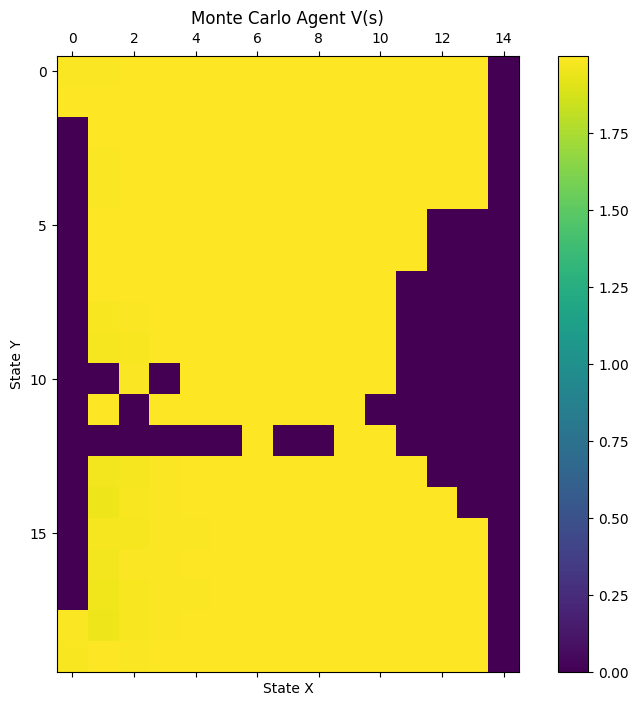

In [99]:
def convert_Q_to_array(Q, num_actions):
    # Initialize an array for Q-values
    Q_array = np.zeros((15, 20, num_actions))
    for (state, action), value in Q.items():
        if state is not None:
            x, y = state  
            Q_array[x, y, action] = value
    return Q_array

def plot_state_value_function(Q, title="State-Value Function"):
    # Calculate V(s) from Q-values: V(s) = max_a Q(s, a)
    V = np.max(Q, axis=2) 

    fig, ax = plt.subplots(figsize=(10, 8))
    cax = ax.matshow(V.T, cmap='viridis')
    fig.colorbar(cax)
    ax.set_title(title)
    ax.set_xlabel('State X')
    ax.set_ylabel('State Y')
    plt.show()

Q_array = convert_Q_to_array(agent_mc.Q, agent_mc.num_actions)
plot_state_value_function(Q_array, "Monte Carlo Agent V(s)")

In [97]:
def plot_state_value_function(Q,title="State-Value Function"):
    # Calculate V(s) from Q-values: V(s) = max_a Q(s, a)
    V = np.max(Q, axis=2)  # Assume Q has shape [num_states_x, num_states_y, num_actions]

    fig, ax = plt.subplots(figsize=(10, 8))
    cax = ax.matshow(V.T, cmap='viridis')
    fig.colorbar(cax)
    ax.set_title(title)
    ax.set_xlabel('State X')
    ax.set_ylabel('State Y')
    plt.show()

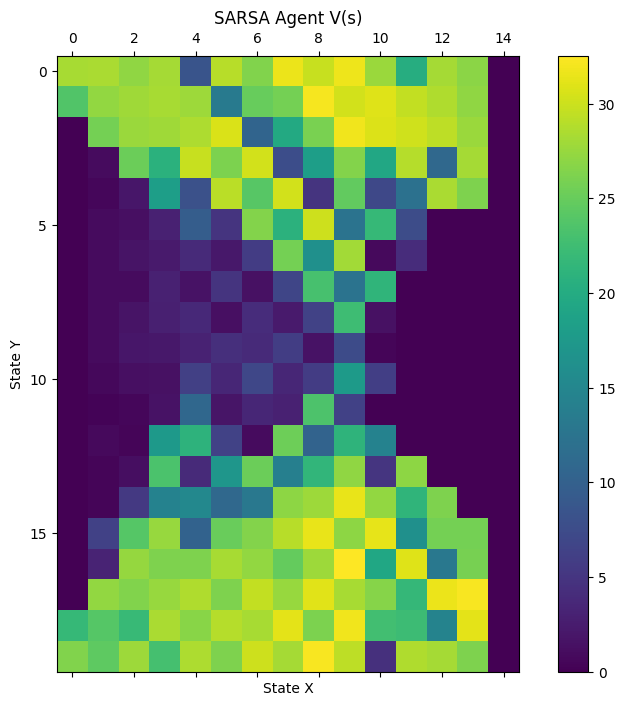

In [98]:
#plot_state_value_function(agent_mc.Q, "Monte Carlo Agent V(s)")
plot_state_value_function(agent_sa.Q, "SARSA Agent V(s)")

# Try on different configuration

MonteCarlo:

In [120]:
env = gym.make('TextFlappyBird-v0', height = 10, width = 15, pipe_gap = 2)
num_episodes = 100
total_reward = []
total_score = []
for i_episode in tqdm(range(num_episodes)):
    obs, _ = env.reset()
    score = 0
    
    while True:
        obs, reward, done, info = agent_mc.agent_step(obs, env)
        
        score += reward
        if info['score'] >50 or done: # in case the bird stays alive for too long time
            agent_mc.update_Q()
            agent_mc.update_params()
            total_score.append(info['score'])
            total_reward.append(score)
            break
env.close()

100%|██████████| 100/100 [00:06<00:00, 14.61it/s]


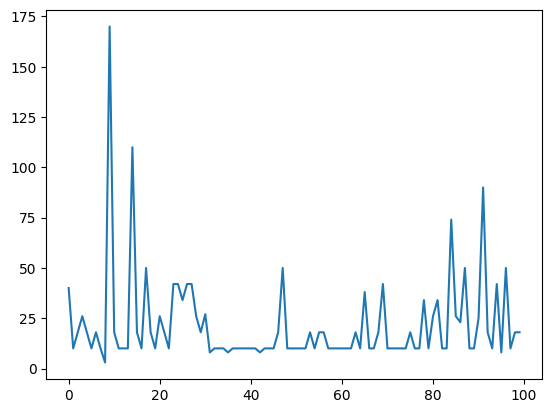

In [121]:
plt.plot(total_reward)

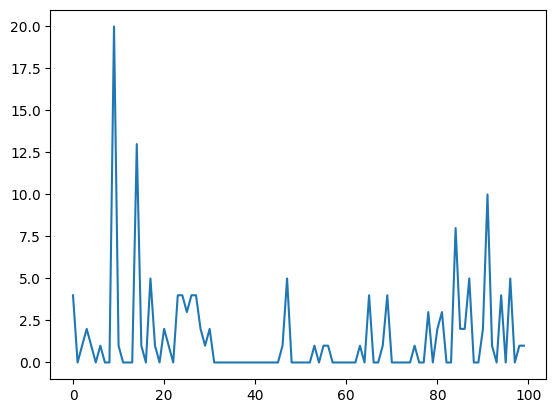

In [122]:
plt.plot(total_score)

In [123]:
np.mean(total_reward)

21.4

SARSA:

In [124]:
env = gym.make('TextFlappyBird-v0', height = 10, width = 15, pipe_gap = 3)
num_episodes = 100
total_reward = []
total_score = []
for i_episode in range(num_episodes):
    obs, _ = env.reset()
    score = 0
    action = agent_sa.agent_start(obs)
    obs, reward, done,_, info = env.step(action)
    while True:
        action = agent_sa.agent_step(reward, obs)
        obs, reward, done,_, info = env.step(action)
        score += reward
        if info['score'] >50 or done:
            agent_sa.agent_end(reward)
            total_score.append(info['score'])
            total_reward.append(score)
            break
env.close()

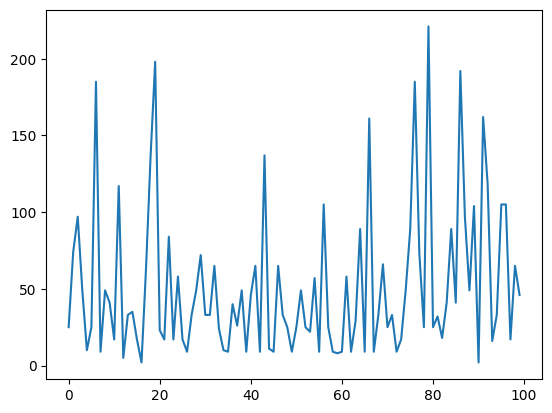

In [125]:
plt.plot(total_reward)

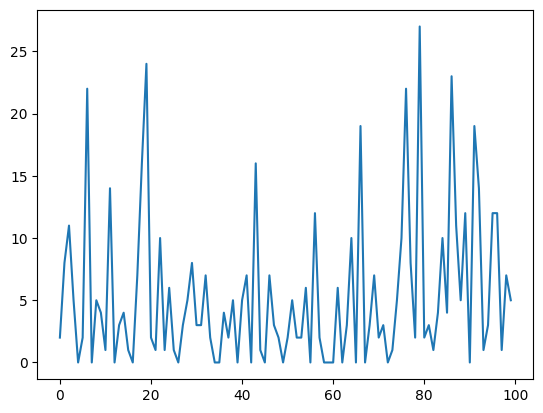

In [126]:
plt.plot(total_score)

In [127]:
np.mean(total_reward)

51.64